# INF4480 Spring of 2021 - Project 6: Adaptive Filters
### By Olav Fønstelien 2021-04-XX
<br>

### Notes:
* Implementation in Python using NumPy, SciPy, matplotlib
* You will find the filtered audio files in my GitHub repo [on this location (audio-files-filtered)](https://github.com/fonstelien/INF4480/tree/main/project6)

Before we start, let's first set up the Python environment:

In [1]:
### Setting up environment
import os
import numpy as np
from numpy import sqrt, log10
from scipy.fft import fft
from scipy.io import wavfile
from scipy.linalg import norm, convolution_matrix as convm
from scipy.signal import correlate
import matplotlib.pyplot as plt
import IPython.display as ipd

### Setting plotting style
plt.style.use('fivethirtyeight')
COLORS = plt.rcParams['axes.prop_cycle'].by_key()['color']

We will reuse some functions from Project 3 about power spectrum density estimation, so let's import those

In [2]:
### Importing PSD estimator functions form project 3
from project3 import periodogram, welch, multitaper, spectrogram

Input and ouput directories:

In [3]:
### Input and ouput directories
indir = './audio-files/'
outdir = './audio-files-filtered/'

## Introduction

In this assignment we will look at two implementations of the Wiener-Hopf based adaptive filters
* the Least Mean Squares (LMS) filter -- and
* the related Normalized Least Mean Squares (NLMS) filter
We will test the filters on audio clips which are distorted by either narrowband (Assignment 1) or broadband noise (Assignment 2.1) which is uncorrelated with the wanted signal. At last we will also see how correlated noise in old audio recordings can be cancelled (Assignment 2.2).

### FIR Adaptive Filter
We want to extract the signal $d(n)$ from the observation $x(n)$ by filtering out the noise $v(n)$, where
$$
x(n) = d(n) + v(n).
$$
We do not constrain $d(n),v(n)$ to be stationary, but the stronger the autocorrelation in either one of the signals is, the better. The adaptive FIR filter has the form $\{w_n(k)\}_{k=0}^{p}$ and the signal $d(n)$ is estimated from $x(n)$ by
$$
\hat{d}(n) = \sum_{k=0}^p w_n(k) x(n-k).
$$
The basic idea behind a noise cancelling filter is similar to that of linear prediction. Only the part of the signal which can be constructed or _predicted_ from its $p$ past values can be separated from noise. Thus, in the ideal case the noise is white and at any time $n$ the signal can be described completely by an MA($p$) ($p$-order moving-average) filter. To make the prediction, we create a reference signal $x_0(n) = x(n-n_0)$ by passing $x(n)$ through a (lagging) timeshift, and optimize the filter $w_n(k)$ such that it minimizes the expected mean-square error $\mathbb{E}(|e(n)|^2)$, where
$$
e(n) = x(n) - \sum_{k=0}^p w_n(k) x_0(n-k) = d(n) + v(n) - \hat{d}(n) = \hat{v}(n).
$$
The filter $\{w_n(k)\}_{k=0}^{p}$ can then be calculated using the time-varying Wiener-Hopf equation
$$
\mathbf{w}_n = \mathbf{R}_{x_0}^{-1}(n) \mathbf{r}_{dx_0}(n), \quad \text{where} \quad \mathbf{R}_{x_0} \in \mathbb{C}^{(p+1) \times (p+1)}, \quad \mathbf{r}_{dx_0} \in \mathbb{C}^{(p+1)}.
$$
But, $\mathbf{R}_{x_0}, \mathbf{r}_{dx_0}$ are generally unknown. Instead of approximating them, it may be more computationally efficient to search for the optimum filter weights at each time step $n$ by using the Steepest Descent method. By this method, we initialize the weights to zero;
$$
\mathbf{w}_0 = \mathbf{0}
$$
and iteratively update the weights by the rule
$$
\mathbf{w}_{n+1} = \mathbf{w}_n + \mu \hat{\mathbb{E}}[e(n) \mathbf{x}_0^*(n)]
$$
where $\mu$ is some step size, $\hat{\mathbb{E}}[\cdot]$ is the sample-mean over some $L$ samples, and $\mathbf{x}_0^*(n) = [x_0(n-0), x_0(n-1), ..., x_0(n-p)]^H$.

### The LMS Filter Algorithm
The LMS filter will approximate the sample mean by using only a single sample, i.e. $L = 1$. The filter weight update rule then becomes
$$
\mathbf{w}_{n+1} = \mathbf{w}_n + \mu e(n) \mathbf{x}_0^*(n)
$$
which requires only $4p+5$ FLOPs per iteration. The LMS algorithm for estimating the signal $d(n))$ and noise $v(n$ from the observation $x(n) = d(n) + v(n)$ at every time step $n = 0,1,...,N-1$ is as follows:

1. Initialize $\mathbf{w}_{0} = \mathbf{0}, n = 0$; Then
2. $\hat{d}(n) \leftarrow \sum_{k=0}^p w_n(k) x_0(n-k)$
3. $\hat{v}(n) \leftarrow x(n) - \hat{d}(n)$
4. $\mathbf{w}_{n} \leftarrow \mathbf{w}_{n} + \mu \hat{v}(n) \mathbf{x}_0^*(n)$
5. $n \leftarrow n + 1$
6. Repeat from 2.

A Python implementation follows below.

In [4]:
def lms(x0, x, mu, n_ord, w0=None):
    '''
    The Least Mean Squares adaptive filter. 
    Inputs are
        x0     reference signal
        x      observed signal
        mu     step size
        n_ord  filter order
    
    Returns a tuple (W, y, e), where 
        W      are the filter weights
        d      is an estimate of the correlated part of the signal; and 
        v      is an estimate of the uncorrelated part of the signal.
    '''
    
    # Set up data structures
    X = convm(x0, n_ord)
    X = X[:-n_ord+1,:]
    M, N = X.shape
    W = np.zeros(X.shape)
    if w0:
        W[0,:] = w0
    v = np.zeros(M)
    d = np.zeros(M)
    
    # Initialize
    d[0] = np.sum(W[0,:]*np.conj(X[0,:]))
    v[0] = x[0] - d[0]
    
    # Recursive calculation of filter weights W, output sequence d, and noise sequence v
    for k in range(1, M):
        W[k,:] = W[k-1,:] + mu*X[k-1,:]*v[k-1]
        d[k] = np.sum(W[k,:]*np.conj(X[k,:]))
        v[k] = x[k] - d[k]
        
    # Output gain
    d, v = d/mu, v/mu
    
    return (W, d, v)

The step size is an important parameter for the algorithm to produce good results. As outlined in Hayes, it is bounded by
$$
0 < \mu < \mu_{max} = \frac{2}{(p+1)\hat{\mathbb{E}}[|x_0(n)|^2]}
$$
In practice, we should select a step size which is at least an order of magnitude smaller than the maximum, such that
$$
0 < \mu \le 0.1 \cdot \mu_{max}
$$
In Python we find $\mu_{max}$ by this simple method:

In [5]:
def mu_max(x, n_ord):
    '''Maximum step size for the LMS algorithm.'''
    return 2/((n_ord+1)*x.var())

### Normalized LMS Filter Algorithm
In the _standard_ LMS algorithm above we decide on the step size $\mu$ before we start the calculation, and choose it such that it will be within bounds for the whole sequence $\{x_0(n)\}_{n=0}^{N-1}$. But, since we do not require stationarity in the signals, it might be better to dynamically adjust it depending on the LMS gradient $e(n) \mathbf{x}_0^*(n)$. We calculate a new step size $\mu_n$ at each time $n$ using only the secuence $\{x_0(n)\}_{k=n}^{n+p+1}$. $\mu_n$ is then dynamically bounded;
$$
0 < \mu_n < \mu_{n,max} = \frac{2}{(p+1)\hat{\mathbb{E}}[|x_0(n)|^2]} = \frac{2}{(p+1) \frac{1}{p+1} \sum_{k=0}^p |x_0(n-k)|^2 } = \frac{2}{\mathbf{x}_0^H(n) \mathbf{x}_0(n)} = \frac{2}{||\mathbf{x}_0(n)||^2}
$$
This lets us select a normalized step size $\beta \in (0,2)$ such that
$$
\mu_n = \frac{\beta}{||\mathbf{x}_0(n)||^2}
$$
The NLMS filter weight update rule thus becomes
$$
\mathbf{w}_{n+1} = \mathbf{w}_n + \mu_n e(n) \mathbf{x}_0^*(n) = \mathbf{w}_n + \beta e(n) \frac{\mathbf{x}_0^*(n)}{||\mathbf{x}_0(n)||^2}
$$
Now, the NLMS algorithm for estimating the signal $d(n))$ and noise $v(n$ from the observation $x(n) = d(n) + v(n)$ at every time step $n = 0,1,...,N-1$ is as follows:

1. Initialize $\mathbf{w}_{0} = \mathbf{0}, n = 0$; Then
2. $\hat{d}(n) \leftarrow \sum_{k=0}^p w_n(k) x_0(n-k)$
3. $\hat{v}(n) \leftarrow x(n) - \hat{d}(n)$
4. $\mu_n \leftarrow \frac{\beta}{{||\mathbf{x}_0(n)||^2}}$
5. $\mathbf{w}_{n} \leftarrow \mathbf{w}_{n} + \mu_n \hat{v}(n) \mathbf{x}_0^*(n)$
6. $n \leftarrow n + 1$
7. Repeat from 2.

A Python implementation follows below. Note that we have added a small stability factor ```eps``` in the denominator when we calculate ```mu``` to avoid running into problems when the length of the vector is very small.

In [6]:
def nlms(x0, x, beta, n_ord, w0=None):
    '''
    The Normalized Least Mean Squares adaptive filter. 
    Inputs are
        x0     reference signal
        x      observed signal
        beta   normalized step size
        n_ord  filter order
    
    Returns a tuple (W, y, e), where 
        W      are the filter weights
        d      is an estimate of the correlated part of the signal; and 
        v      is an estimate of the uncorrelated part of the signal.
    '''

    # Set up data structures
    X = convm(x, n_ord)
    X = X[:-n_ord+1,:]
    M, N = X.shape
    W = np.zeros(X.shape)     
    if w0:
        W[0,:] = w0
    v = np.zeros(M)
    d = np.zeros(M)
    
    # Initialize
    d[0] = np.sum(W[0,:]*np.conj(X[0,:]))
    v[0] = x0[0] - d[0]
    
    # Recursive calculation of filter weights W, output sequence d, and noise sequence v
    eps = 1e-4  # Stability factor
    for k in range(1, M):
        mu = beta/(norm(X[k-1,:])**2 + eps)
        W[k,:] = W[k-1,:] + mu*X[k-1,:]*v[k-1]
        d[k] = np.sum(W[k,:]*np.conj(X[k,:]))
        v[k] = x0[k] - d[k]
        
    # Output gain
    d, v = d/beta, v/beta

    return (W, d, v)

In [7]:
### Preprocess for uint8 for wav export

def to_uint8(x):
    '''Scales and converts x to np.uint8'''
    x = x + (-1)*x.min()
    x = x/x.max()
    x = x*255
    return x.astype(np.uint8)

In [52]:
### Structure for common plotting of signals

def plot_figs(x, d, fs, normalize=True, K=16, L=256):
    '''Plots Autocorrelation, PSD and Spectrograms for signals x, d'''
    fig, axes = plt.subplots(ncols=1, nrows=4, sharex=False, sharey=False, figsize=(15,22))
    
    N = d.size
    if x.size > N:
        x = x[:N]
    
    # Autocorrelation
    rxx = correlate(x, x, mode='full')
    rdd = correlate(d, d, mode='full')
    rxx = rxx/np.abs(rxx).max()
    rdd = rdd/np.abs(rdd).max()
    n = np.arange(-N+1,N)
    
    ax = axes[0]
    ax.set_title('Autocorrelation')
    ax.plot(n, rxx, lw=2, label=r'$x(n)$')
    ax.plot(n, rdd, lw=2, label=r'$d(n)$')
    ax.set_ylabel(r'$r_{xx}(l)$ intensity')
    ax.set_xlabel(r'$l$')
    ax.legend(loc='upper right')
    
    # PSD
    Pxx = multitaper(x, normalize=normalize, K=K)
    Pdd = multitaper(d, normalize=normalize, K=K)
    f = np.linspace(-fs/2, fs/2, x.size)/1000

    ax = axes[1]
    ax.set_title('PSD')
    ax.plot(f, 10*log10(Pxx), lw=2, label=r'$x(n)$')
    ax.plot(f, 10*log10(Pdd), lw=2, label=r'$d(n)$')
    ax.set_ylabel(r'dB')
    ax.set_xlabel(r'kHz')
    ax.legend(loc='upper right')
    
    # Spectrograms
    sx = spectrogram(x, L, D=L//2, normalize=normalize, fperiodogram=multitaper, fargs={'K':4, 'zero_pad':4})
    sd = spectrogram(d, L, D=L//2, normalize=normalize, fperiodogram=multitaper, fargs={'K':4, 'zero_pad':4})
    sx = sx/sx.max()
    sd = sd/sd.max()
    nt, nf = sx.shape 
    t = np.linspace(0, N/fs, nt)
    f = np.linspace(-fs/2, fs/2, nf)/1000
    tt, ff = np.meshgrid(t,f)
    
    ax = axes[2]
    ax.set_title(r'Spectrogram $x(n)$')    
    cm = ax.pcolormesh(tt, ff, 10*log10(sx.T), shading='auto', cmap='jet', vmin=-90, vmax=0)
    cbar = plt.colorbar(cm, ax=ax)
    cbar.ax.set_title('dB')
    ax.set_xlabel('time')
    ax.set_ylabel('frequency')

    ax = axes[3]
    ax.set_title(r'Spectrogram $d(n)$')    
    cm = ax.pcolormesh(tt, ff, 10*log10(sd.T), shading='auto', cmap='jet', vmin=-90, vmax=0)
    cbar = plt.colorbar(cm, ax=ax)
    cbar.ax.set_title('dB')
    ax.set_xlabel('time')
    ax.set_ylabel('frequency')

    return fig, axes

# Assignment 1 - Removal of tone from broad band signal
## Assignment 1.1 - Audio clip
We are given three audio clips, each of them with voice distorted by tone. In these cases, the _noise_ $v(n)$ is the voices, while the _signal_ $d(n)$ is the tone distortion, since that has the strongest autocorrelation.

Description of the audio clips from the assignment text:
* Undesired carrier on a short wave link: “HF SSB automatic notch filter example #1”: notch1-a.wav
* 3 consecutive tones on a clean recording of female and male voice: kvinne-mann-3toner.wave
* Chirp tone on a clean recording of female and male voice: kvinne-mann-440-4400.wav

### 1.1.1 Audio clip 1 - Undesired carrier on a short wave link
We start by reading in the first file:

In [9]:
# Reading wav file
fname = 'notch1-a.wav'
rate, data = wavfile.read(os.path.join(indir, fname))
duration = data.size/rate

In [10]:
ipd.Audio(os.path.join(indir, fname))

By trial and error we find some suitable filter parameters, and estimate $d(n)$ $v(n)$:

In [11]:
# Filter parameters
n0 = 25  # Reference signal delay
n_ord = 15  # FIR filter order
mu = mu_max(data, n_ord)*.05  # Step size

# Make reference signal x0, and truncate signal x
x0 = data[n0:]
x = data[:-n0]

# Estimate signal d and noise v
_, d, v = lms(x0, x, mu, n_ord)

As explained above, the signal we want to filter is actually the _noise_, ```v```. Plots where we compare ```x``` and the resulting ```v``` are shown below. We see that autocorrelation is very strong in ```x```, while in ```v```, the approximation of _noise_ is quite good, with comparably weak autocorrelation. From the PSD plots we clearly see the tone as a spike around 2300 Hz in the original, while in the filtered signal it has been attenuated completely. This is also clear from the spectrograms. (The PSD and spectrogram  power differences are due to scaling.)

In [12]:
wavfile.write(os.path.join(outdir, 'lms-'+fname), rate, to_uint8(v))
ipd.Audio(os.path.join(outdir, 'lms-'+fname))

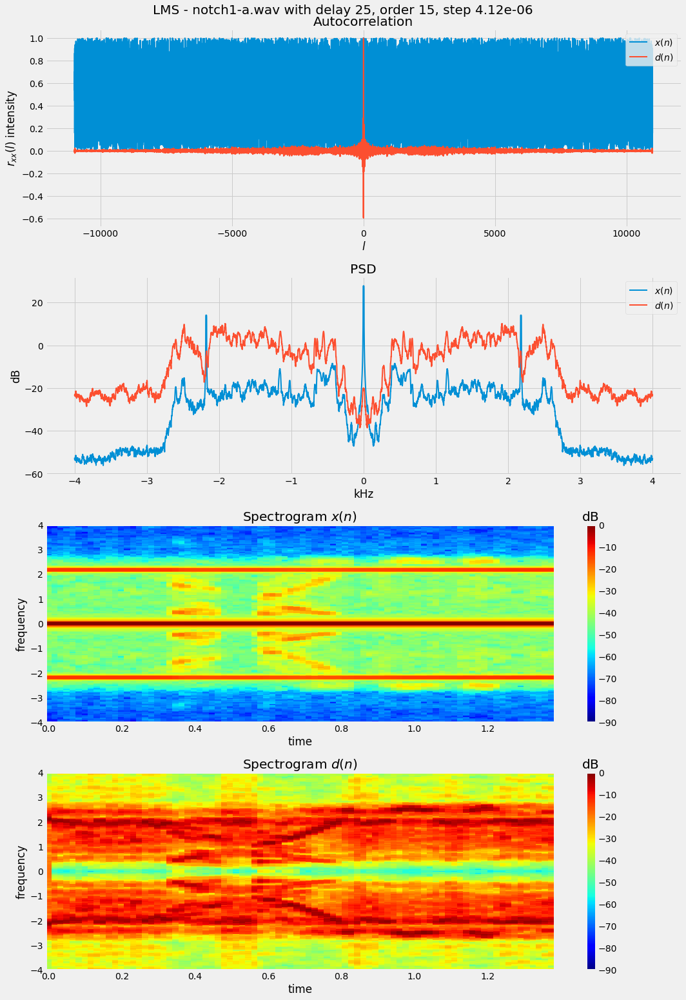

In [13]:
fig, axes = plot_figs(x, v, rate, normalize=True, K=16, L=256*1)
fig.suptitle(rf"LMS - {fname} with delay {n0}, order {n_ord}, step {mu:.2e}", fontsize=20)

plt.tight_layout()
plt.show()

We repeat the exercise for NLMS and find that the more or less corresponding parameters perform well, with the same results in audio quality as well as the signal plots, as seen below.

In [14]:
# Filter parameters
n0 = 25  # Reference signal delay
n_ord = 15  # FIR filter order
beta = .5  # Normalized step size

# Make reference signal x0, and truncate signal x
x0 = data[n0:]
x = data[:-n0]

# Estimate signal d and noise v
(W, d, v) = nlms(x0, x, beta, n_ord)

In [15]:
wavfile.write(os.path.join(outdir, 'nlms-'+fname), rate, to_uint8(v))
ipd.Audio(os.path.join(outdir, 'nlms-'+fname))

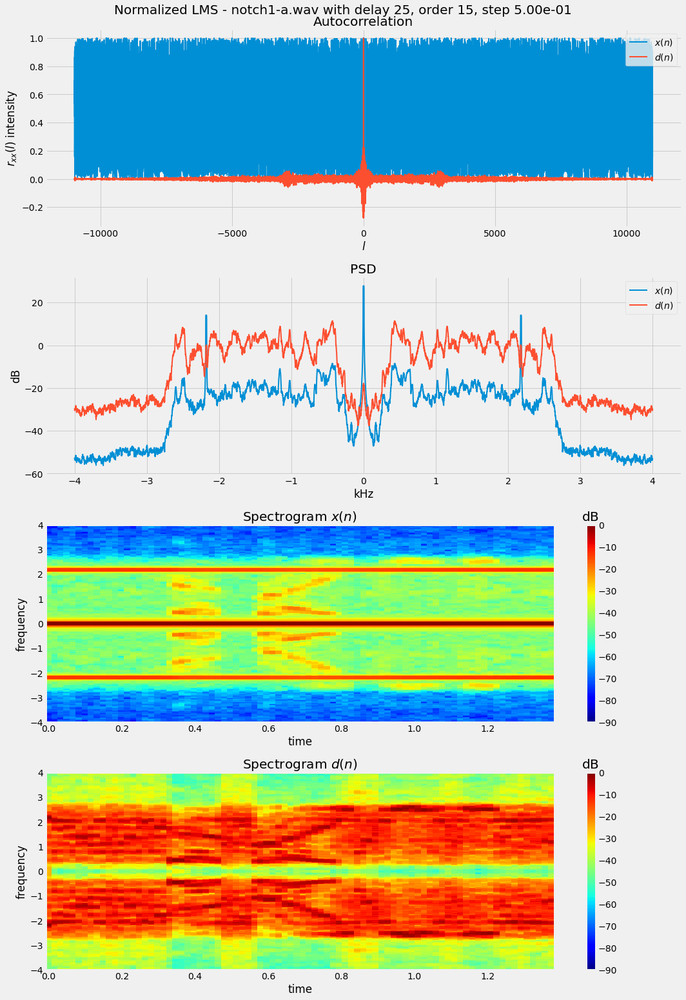

In [16]:
fig, axes = plot_figs(x, v, rate, normalize=True, K=16, L=256*1)
fig.suptitle(rf"Normalized LMS - {fname} with delay {n0}, order {n_ord}, step {beta:.2e}", fontsize=20)
plt.tight_layout()
plt.show()

### 1.1.2 Audio clip 2 - Three consecutive tones on a clean recording of female and male voice
A slightly more interesting case now, with a varying source of noise. We start by reading in the file:

In [97]:
# Reading wav file
fname = 'kvinne-mann-3toner.wav'
rate, data = wavfile.read(os.path.join(indir, fname))
duration = data.size/rate

In [18]:
ipd.Audio(os.path.join(indir, fname))

By trial and error we find some suitable filter parameters, and estimate $d(n)$ $v(n)$:

In [101]:
# Filter parameters
n0 = 50  # Reference signal delay
n_ord = 50  # FIR filter order
mu = mu_max(data, n_ord)*.05  # Step size

# Make reference signal x0, and truncate signal x
x0 = data[n0:]
x = data[:-n0]

# Estimate signal d and noise v
_, d, v = lms(x0, x, mu, n_ord)

As above, the signal we want to filter is the _noise_, ```v```. Especially the first two lower tones benefit from increasing the filter order. $p = 50$ works fine, although with the lowest tone, the voice becomes slightly distorted. Keeping the delay $n_0$ at $25$ leads to a fading signal as the tone gets higher, but increasing $n_0$ to $50$ prevents this (for unknown reason). Again we plot ```v``` against ```x```. We see that autocorrelation is very strong in ```x```, while in ```v```, the approximation of noise by the voices is again quite good. From the PSD plots we clearly see the tones as spikes around 400, 1200 and 2000 Hz, and that they are well attenuated in the filtered signal. This is also confirmed by the spectrograms, which also show the sequence of the three tones in the plot of ```x```. From this we also see the reason why the first tone distorts the voice -- it lies in the same band as the voice, and is therefore to some degree correlated with it. Going back to the PSDs, we see that frequencies in the filtered signal, below about $500$ Hz are attenuated by $10$ dB or so, which gives the voices a _thinner_ sound.

In [102]:
wavfile.write(os.path.join(outdir, 'lms-'+fname), rate, to_uint8(v))
ipd.Audio(os.path.join(outdir, 'lms-'+fname))

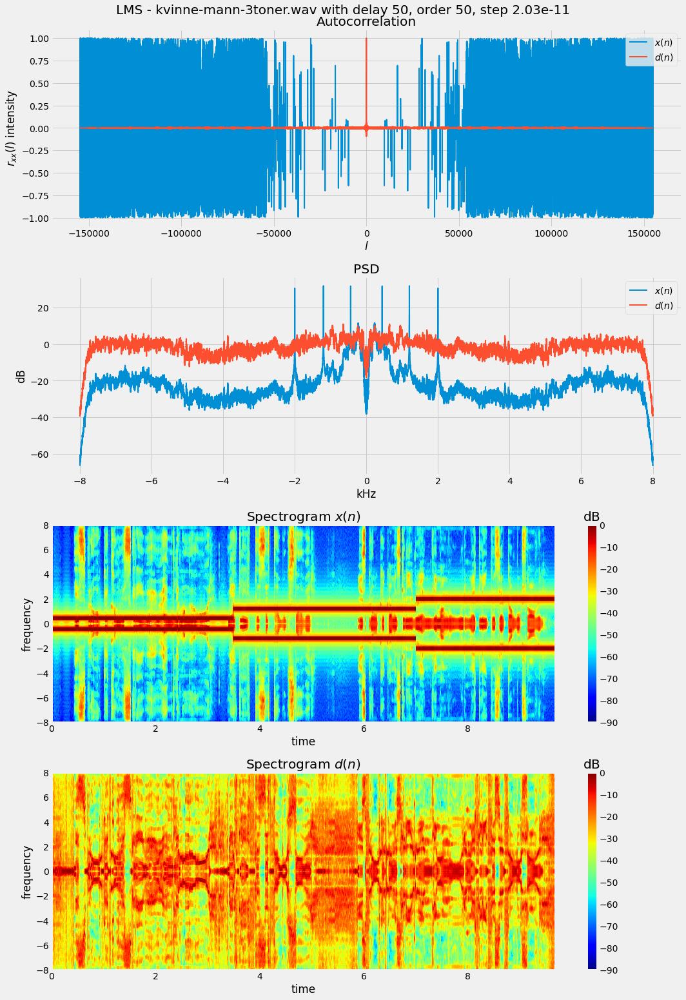

In [103]:
fig, axes = plot_figs(x, v, rate, normalize=True, K=16, L=256*1)
fig.suptitle(rf"LMS - {fname} with delay {n0}, order {n_ord}, step {mu:.2e}", fontsize=20)

plt.tight_layout()
plt.show()

We repeat the exercise for NLMS and find again that more or less corresponding parameters perform well, with the same results in audio quality as well as the signal plots, as seen below.

In [47]:
# Filter parameters
n0 = 50  # Reference signal delay
n_ord = 50  # FIR filter order
beta = .1  # Normalized step size

# Make reference signal x0, and truncate signal x
x0 = data[n0:]
x = data[:-n0]

# Estimate signal d and noise v
(W, d, v) = nlms(x0, x, beta, n_ord)

In [48]:
wavfile.write(os.path.join(outdir, 'nlms-'+fname), rate, to_uint8(v))
ipd.Audio(os.path.join(outdir, 'nlms-'+fname))

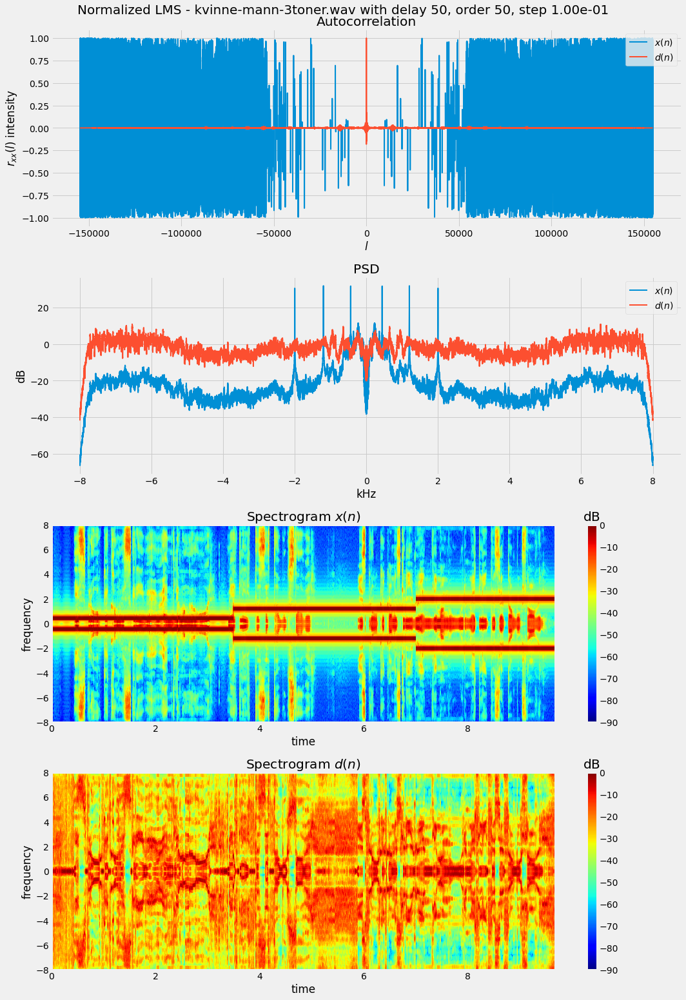

In [49]:
fig, axes = plot_figs(x, v, rate, normalize=True, K=16, L=256*1)
fig.suptitle(rf"Normalized LMS - {fname} with delay {n0}, order {n_ord}, step {beta:.2e}", fontsize=20)
plt.tight_layout()
plt.show()

### 1.1.3 Audio clip 3 - Chirp tone on a clean recording of female and male voice
We start by reading in the file:

In [169]:
# Reading wav file
fname = 'kvinne-mann-440-4400.wav'
rate, data = wavfile.read(os.path.join(indir, fname))
duration = data.size/rate

In [170]:
ipd.Audio(os.path.join(indir, fname))

By trial and error we find some suitable filter parameters, and estimate $d(n)$ $v(n)$:

In [145]:
# Filter parameters
n0 = 10  # Reference signal delay
n_ord = 10  # FIR filter order
mu = mu_max(data, n_ord)*.15  # Step size

# Make reference signal x0, and truncate signal x
x0 = data[n0:]
x = data[:-n0]

# Estimate signal d and noise v
_, d, v = lms(x0, x, mu, n_ord)

As above we keep the _noise_, ```v```. In contrast to above, though, we cannot pick a very long delay for our reference signal, since the chirp tone distortion is constantly changing, and we will not be able to adjust properly unless the delay is short. Above we used $n_0 = 50$, but that is too long here. At $n_0 = 10$ we get good results with $p = 10$, but we need to more agressively adjust the filter coefficients by increasing the step size multiplier to $0.15$. The attenuation is still poorer than in the case with the three consequtive tones, and the distortion in the voices is heavier and does not decrease as the tone leaves the frequency band of the voices. From the PSD plots we see that in ```x```, the chirp tone is completely dominating, but that a lot of it can be filtered out in ```v```. The PSD is however much flatter than in the prevous case, making the voices sound strange.

In [146]:
wavfile.write(os.path.join(outdir, 'lms-'+fname), rate, to_uint8(v))
ipd.Audio(os.path.join(outdir, 'lms-'+fname))

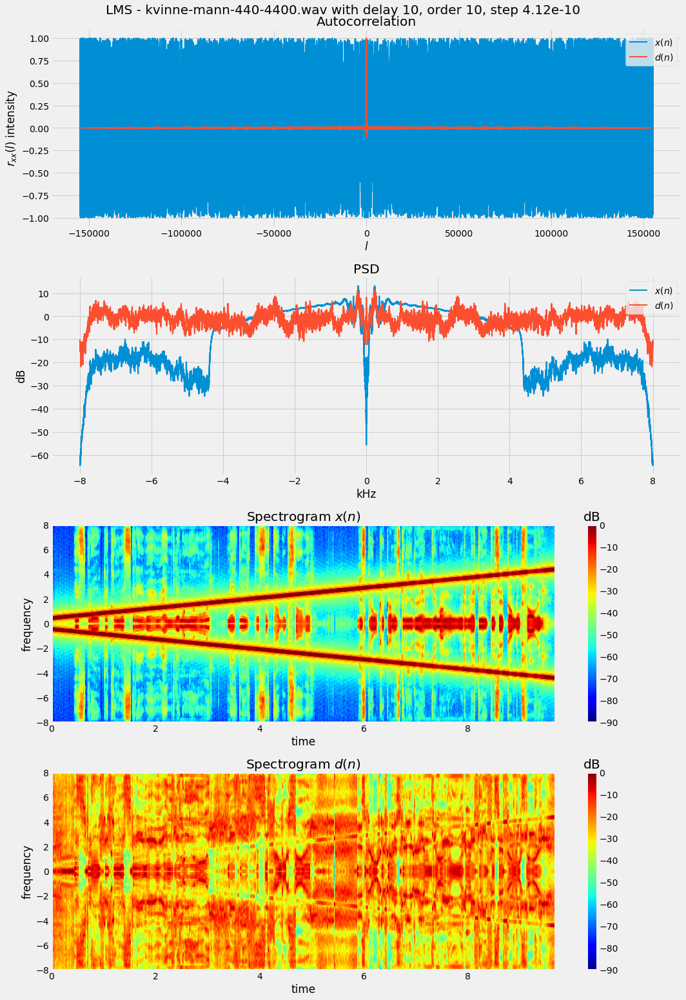

In [147]:
fig, axes = plot_figs(x, v, rate, normalize=True, K=16, L=256*1)
fig.suptitle(rf"LMS - {fname} with delay {n0}, order {n_ord}, step {mu:.2e}", fontsize=20)

plt.tight_layout()
plt.show()

We repeat the exercise for NLMS and find again that more or less corresponding parameters perform well, with the same results in audio quality as well as the signal plots, as seen below.

In [167]:
# Filter parameters
n0 = 10  # Reference signal delay
n_ord = 10  # FIR filter order
beta = .03  # Normalized step size

# Make reference signal x0, and truncate signal x
x0 = data[n0:]
x = data[:-n0]

# Estimate signal d and noise v
(W, d, v) = nlms(x0, x, beta, n_ord)

In [168]:
wavfile.write(os.path.join(outdir, 'nlms-'+fname), rate, to_uint8(v))
ipd.Audio(os.path.join(outdir, 'nlms-'+fname))

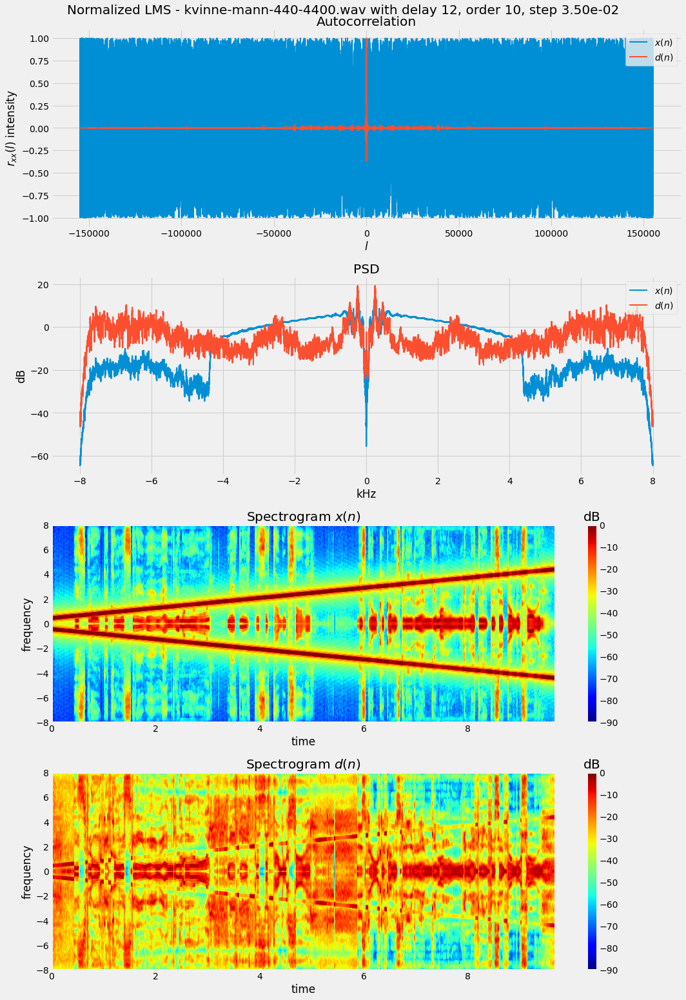

In [94]:
fig, axes = plot_figs(x, v, rate, normalize=True, K=16, L=256*1)
fig.suptitle(rf"Normalized LMS - {fname} with delay {n0}, order {n_ord}, step {beta:.2e}", fontsize=20)
plt.tight_layout()
plt.show()

## Assignment 2 - Removal of broad band noise from broad band signal
### Assignment 2.1 - Sound clip, communications system

In [48]:
fnames = ('./audio-files/hfqrn1-a.wav', './audio-files/2mfm1-a.wav', './audio-files/vhffm1-a.wav')
fname = fnames[0]
rate, data = wavfile.read(fname)
duration = data.size/rate
out = data
for i in range(10):
    out = np.hstack((out, data))
ipd.Audio(out, rate=rate)

<ipython-input-48-a8adab1094a5>:3: WavFileWarning: Incomplete chunk ID: b'\x00', ignoring it.
  rate, data = wavfile.read(fname)
<ipython-input-48-a8adab1094a5>:3: WavFileWarning: Chunk (non-data) not understood, skipping it.
  rate, data = wavfile.read(fname)


In [49]:
n0 = 10  # Reference signal delay
x = data[:-n0]
s_ref = data[n0:]
n_ord = 25  # FIR filter order

In [50]:
mu = mu_max(x, n_ord)*.01
(W, y, e) = lms(x, s_ref, mu, n_ord)

In [40]:
(W, y, e) = nlms(x, s_ref, .25, n_ord)

In [18]:
out_filt = y
for i in range(10):
    out_filt = np.hstack((out_filt, y))
ipd.Audio(out_filt, rate=rate)

### Assignment 2.2 - Improvement of old audio recordings

In [21]:
fnames = ('./audio-files/1936-bbc-nrk-kingedwardabdication-3128-2-5sek.wav', './audio-files/nasjonalbiblioteket-folkemusikk-mzru1377-16sek.wav')
fname = fnames[1]
rate, data = wavfile.read(fname)
duration = data.size/rate
out = data
for i in range(10):
    out = np.hstack((out, data))
ipd.Audio(out, rate=rate)

<ipython-input-21-aebb2baf68e2>:3: WavFileWarning: Chunk (non-data) not understood, skipping it.
  rate, data = wavfile.read(fname)


In [42]:
n0 = 100  # Reference signal delay
x = data[:-n0]
s_ref = data[n0:]
n_ord = 2000  # FIR filter order

In [43]:
mu = mu_max(x, n_ord)*.01
(W, y, e) = lms(x, s_ref, mu, n_ord)

In [51]:
(W, y, e) = nlms(x, s_ref, .01, n_ord)

In [ ]:
out_filt = y
for i in range(10):
    out_filt = np.hstack((out_filt, y))
ipd.Audio(out_filt, rate=rate)